<a href="https://colab.research.google.com/github/yrodriguezmd/Surgical_instruments/blob/main/project/notebooks/Surg_pilot_new_workflow_oct12_5pm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Pilot new workflow

In [1]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-10-12 18:09:19--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 595 [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]     595  --.-KB/s    in 0s      

2021-10-12 18:09:19 (30.4 MB/s) - ‘install_colab.sh’ saved [595/595]

- Installing mmcv
installing mmcv-full from wheel.
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
     |████████████████████████████████| 36.7 MB 59 kB/s 
     |████████████████████████████████| 185 kB 5.1 MB/s 
- Installing mmdet
installing mmdet from https://github.com/open-mmlab/mmdetection.git.
Cloning into '/tmp/tmpgbyj088h/mmdetection'...
remote: Enumerating objects: 2112

In [3]:
exit()

In [ ]:
import icevision

In [2]:
from icevision.all import *
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.10.0a1
torch v 1.9.0+cu111
torchvision v 0.10.0+cu111


After trials of training in notebook Surg100_400_loading_model,

last model was downloaded to local computer.

Can load model on a new notebook (Surg100_400_saving/loading_tries_oct11)

In [6]:
!git clone https://github.com/yrodriguezmd/Surg_pilot.git
# check if able to read release

Cloning into 'Surg_pilot'...
remote: Enumerating objects: 130, done.
remote: Counting objects: 100% (130/130), done.
remote: Compressing objects: 100% (125/125), done.
remote: Total 130 (delta 2), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (130/130), 3.00 MiB | 25.42 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [8]:
!ls Surg_pilot/Sets

Set_0  Set_1


Initial inference from pretrained vfnet

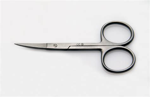

In [10]:
# using Surg100 as Set_0
image_path = Path('Surg_pilot/Sets/Set_0')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [11]:
# using model pretrained on coco
CLASSES = ('person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
               'train', 'truck', 'boat', 'traffic light', 'fire hydrant',
               'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog',
               'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe',
               'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
               'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
               'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
               'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
               'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot',
               'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
               'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop',
               'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
               'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock',
               'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush')
class_map = ClassMap(CLASSES)
len(class_map)

81

In [ ]:
from icevision.models import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x ##

model = model_type.model(backbone = backbone(pretrained=True), num_classes = len(class_map))

In [13]:
backbone.__dict__

{'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs/vfnet/vfnet_r50_fpn_mstrain_2x_coco.py'),
 'model_name': 'vfnet',
 'pretrained': True,
 'weights_url': 'https://openmmlab.oss-cn-hangzhou.aliyuncs.com/mmdetection/v2.0/vfnet/vfnet_r50_fpn_mstrain_2x_coco/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth'}

Inference on Set 0

In [ ]:
!ls

install_colab.sh  Surg100_400_notfms_lr-2_mAP61      Surgical_instruments
sample_data	  Surg100_400_notfms_lr-2_mAP61.zip


In [14]:
model.eval()

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:974: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [15]:
# generating pseudolabels
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 

  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


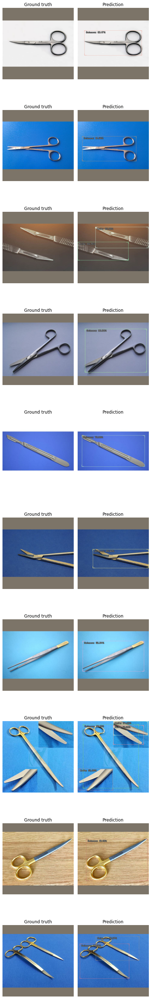

In [16]:
show_preds(preds = preds_saved[0:10])

In [17]:
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved)

In [18]:
add_info = {
    "info": {
    "description": "Surgery Instruments",
    "url": "http://cocodataset.org",
    "version": "1.0",
    "year": 2021,
    "contributor": "MR",
    "date_created": "2021/09/27"
    },
  "categories": [
                 ## adjusted to 80 classes, 
                 ## limiting categories
    {
      "supercategory": "kitchen",
      "id": 44,
      "name": "knife"
    },
    {
      "supercategory": "indoor",
      "id": 77,
      "name": "scissors"
    }
    ] }

In [19]:
annot = {**add_info, **conv}

f = open('annot.json','w') 
f.write(str(annot)) 
f.close()

In [20]:
## skip annotation for now, already in roboflow
# train, val, test split in roboflow

In [26]:
# temporary
## but unable to upload folders
#from google.colab import files
#files.upload()

# uploaded files in gdrive
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)
root_dir = Path('/content/gdrive/MyDrive')

Mounted at /content/gdrive


In [32]:
!ls gdrive/MyDrive/Surg_pilot

train  valid


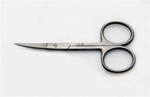

In [33]:
image_path = Path('gdrive/MyDrive/Surg_pilot/train')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [24]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)
len(class_map)

16

In [37]:
path = Path('gdrive/MyDrive/Surg_pilot')

train_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'train/_annotations.coco.json',
    img_dir = path/'train'
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'valid/_annotations.coco.json',
    img_dir = path/'valid'
)

In [25]:
#parser = parsers.COCOBBoxParser(
 #   annotations_filepath = Path('gdrive/MyDrive/Surg_pilot/_annotations.coco.json'),
  #  img_dir = Path('gdrive/MyDrive/Surg_pilot', mask=False))

In [40]:
whole = SingleSplitSplitter()

train_records, *_ = train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)
# * essential

  0%|          | 0/93 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/20 [00:00<?, ?it/s]

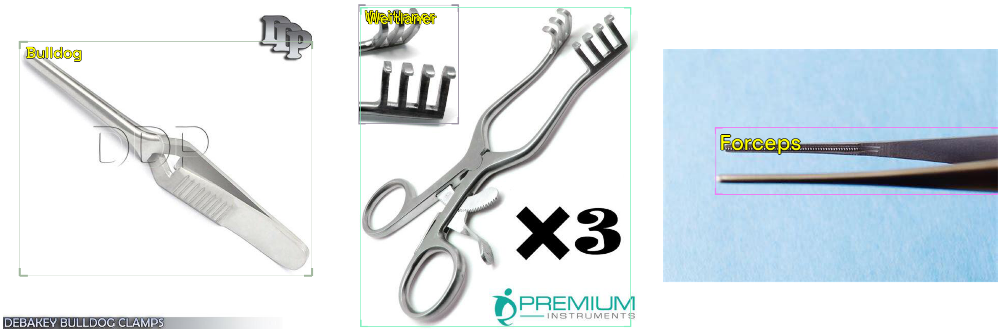

In [41]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

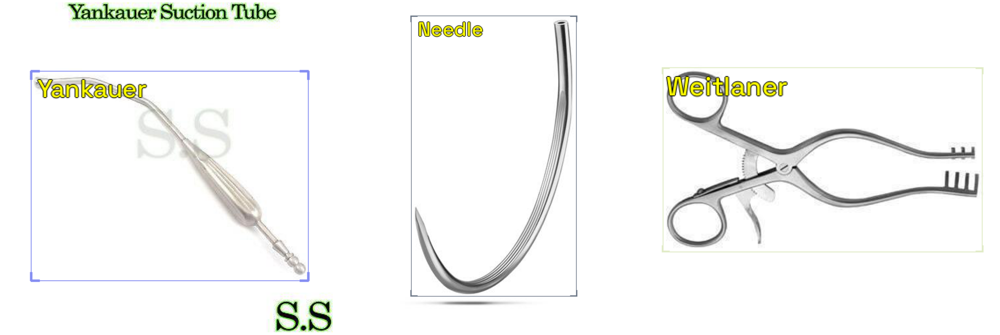

In [42]:
show_records(valid_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [43]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [44]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

model_type = models.mmdet.retinanet ##
backbone = model_type.backbones.resnet50_fpn_1x ##

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)
#model_type = models.mmdet.vfnet ##
#backbone = model_type.backbones.resnet50_fpn_mstrain_2x ##

##model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)

In [46]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=7.585775892948732e-05)

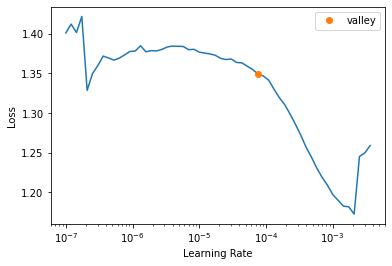

In [47]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics)
learn.lr_find() 

In [48]:
learn.fine_tune(10, 1e-4)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.354281,1.078648,0.044544,00:07


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.298119,1.057172,0.157968,00:06
1,1.270093,1.029667,0.214618,00:05
2,1.232974,0.945156,0.229835,00:05
3,1.172928,0.912317,0.246230,00:05
4,1.098770,0.893494,0.144583,00:05
5,1.030969,0.856186,0.163321,00:05
6,0.968982,0.826729,0.188721,00:05
7,0.923623,0.820247,0.221997,00:05
8,0.879517,0.817488,0.229722,00:05
9,0.847322,0.817474,0.220395,00:05


In [ ]:
checkpoint_path = 'Model_A_pilot.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.retinanet', 
                        backbone_name='resnet50_fpn_1x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

checkpoint_and_model = model_from_checkpoint(checkpoint_path)

In [ ]:
model = checkpoint_and_model['model']

Use Model A to infer on Set 2 (Surg200) raw images

In [54]:
!ls gdrive/MyDrive/Surg_pilot/Set_2

raw_images  Set_2


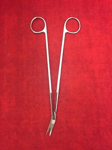

In [57]:
images = Path('gdrive/MyDrive/Surg_pilot/Set_2/raw_images')

img_files = get_image_files(images)

img = PIL.Image.open(img_files[0])
#img = img.convert('RGB')

img.to_thumb(150,150)

In [ ]:
model = checkpoint_and_model['model']
model.eval()  # default, but just in case

In [58]:
# same classes

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [59]:
# generating pseudolabels for Set 2 using Model A
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 

  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


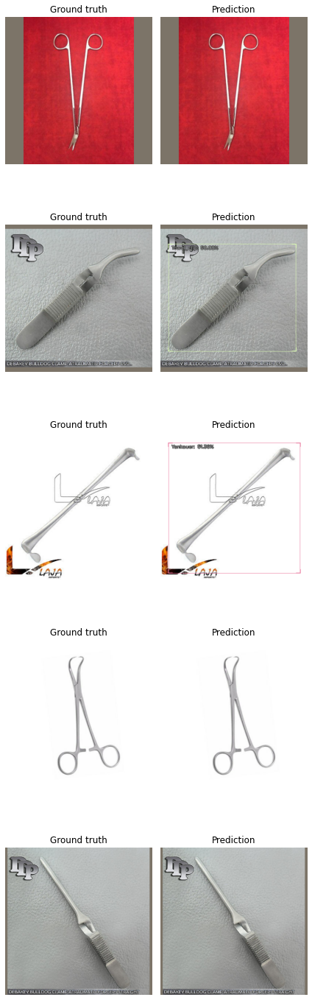

In [60]:
show_preds(preds = preds_saved[0:5])

Using Surg200 refined labels in roboflow.  Merged Surg100 and 200 train, valid, test.

Finetune retinanet ModelA, outcome Model B.

In [66]:
!ls gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt

README.dataset.txt  README.roboflow.txt  test  train  valid


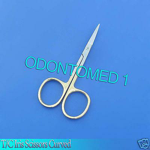

In [68]:
image_path = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt/train')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[101]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [69]:
# same classes

In [70]:
path = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt')

train_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'train/_annotations.coco.json',
    img_dir = path/'train'
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'valid/_annotations.coco.json',
    img_dir = path/'valid'
)

In [71]:
whole = SingleSplitSplitter()

train_records, *_ = train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

  0%|          | 0/176 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/39 [00:00<?, ?it/s]

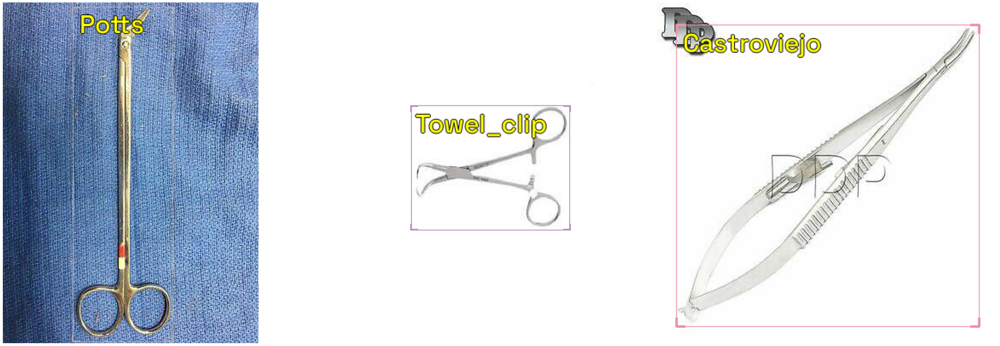

In [72]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

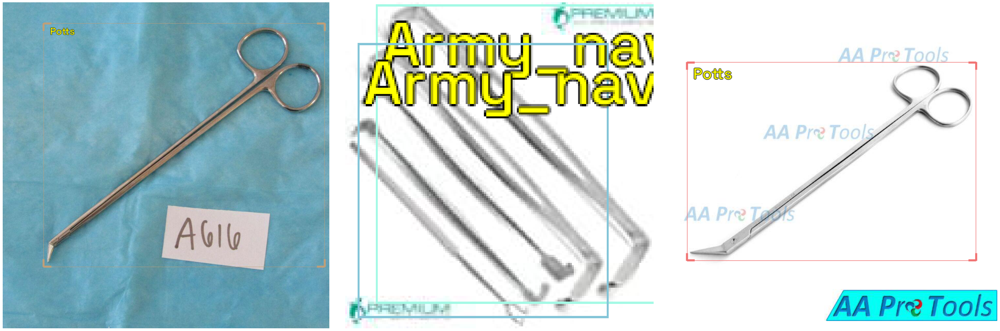

In [73]:
show_records(valid_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [ ]:
model_type = models.mmdet.retinanet ##
backbone = model_type.backbones.resnet50_fpn_1x ##

model = checkpoint_and_model['model']  # Model A
model.train()

In [ ]:
## same
#presize = 512
#image_size = 384

#train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
#valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [75]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [76]:
# same metric

In [77]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=4.365158383734524e-05)

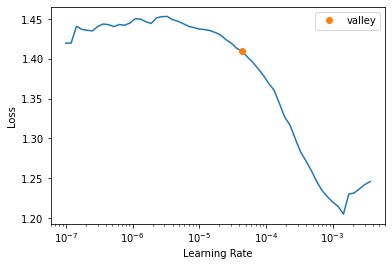

In [78]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics) # model A
learn.lr_find()

In [79]:
learn.fine_tune(10, 1e-4)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.384375,1.257020,0.060215,00:10


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.155106,1.164871,0.078861,00:09
1,1.080016,1.064241,0.079447,00:09
2,0.991375,0.966136,0.087204,00:09
3,0.907364,0.911654,0.112225,00:10
4,0.837462,0.895652,0.140918,00:09
5,0.781793,0.890199,0.164598,00:09
6,0.736587,0.881313,0.144001,00:09
7,0.699482,0.867150,0.148527,00:09
8,0.669679,0.869869,0.154157,00:09
9,0.645549,0.869590,0.152996,00:09


In [ ]:
checkpoint_path = 'Model_B_pilot.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.retinanet', 
                        backbone_name='resnet50_fpn_1x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

checkpoint_and_model = model_from_checkpoint(checkpoint_path)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


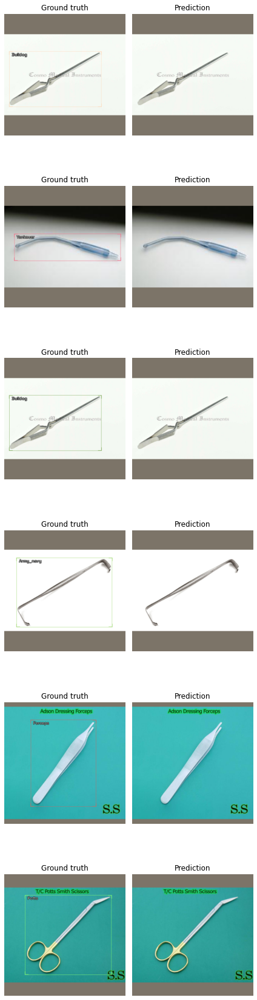

In [81]:
model_type.show_results(model, valid_ds)

Using Model B, do inference on Set 3.



In [83]:
!ls gdrive/MyDrive/Surg_pilot/Set_3

raw_images


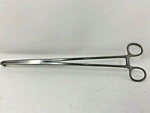

In [84]:
image_path = Path('gdrive/MyDrive/Surg_pilot/Set_3/raw_images')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [85]:
# same classes
# same metric

In [86]:
imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)
model = chekpoint_and_model(['model']) # Model B
model.eval()

In [87]:
# generating pseudolabels of Set 3 using Model B
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 

  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


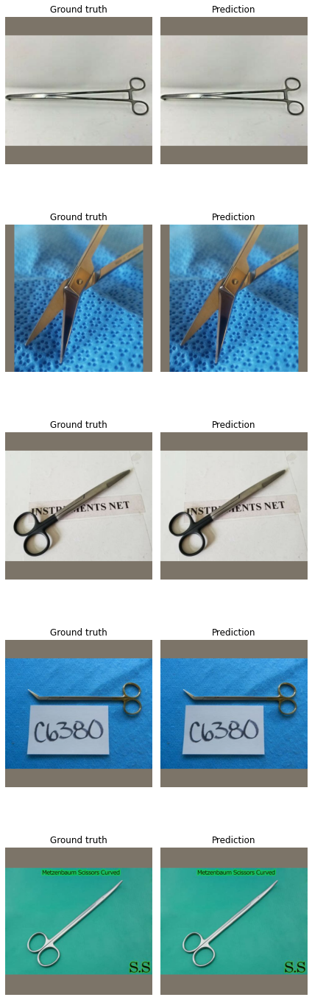

In [88]:
show_preds(preds = preds_saved[0:5])

In [89]:
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved) 

In [90]:
# not editing supercategories for now
add_info = {
    "info": {
        "year": "2021",
        "version": "1",
        "description": "Exported from roboflow.ai",
        "contributor": "",
        "url": "https://public.roboflow.ai/object-detection/undefined",
        "date_created": "2021-10-05T20:13:09+00:00"
    },
    "licenses": [
        {
            "id": 1,
            "url": "https://creativecommons.org/licenses/by/4.0/",
            "name": "CC BY 4.0"
        }
    ],
    "categories": [
        {
            "id": 0,
            "name": "instruments",
            "supercategory": "none"
        },
        {
            "id": 1,
            "name": "Army_navy",
            "supercategory": "Retractor"
        },
        {
            "id": 2,
            "name": "Bulldog",
            "supercategory": "Clamp"
        },
        {
            "id": 3,
            "name": "Castroviejo",
            "supercategory": "Needle_holder"
        },
        {
            "id": 4,
            "name": "Forceps",
            "supercategory": "Forceps"
        },
        {
            "id": 5,
            "name": "Frazier",
            "supercategory": "Suction"
        },
        {
            "id": 6,
            "name": "Hemostat",
            "supercategory": "Clamp"
        },
        {
            "id": 7,
            "name": "Iris",
            "supercategory": "Scissors"
        },
        {
            "id": 8,
            "name": "Mayo_metz",
            "supercategory": "Scissors"
        },
        {
            "id": 9,
            "name": "Needle",
            "supercategory": "Needle"
        },
        {
            "id": 10,
            "name": "Potts",
            "supercategory": "Scissors"
        },
        {
            "id": 11,
            "name": "Richardson",
            "supercategory": "Retractor"
        },
        {
            "id": 12,
            "name": "Scalpel",
            "supercategory": "Scalpel"
        },
        {
            "id": 13,
            "name": "Towel_clip",
            "supercategory": "Clamp"
        },
        {
            "id": 14,
            "name": "Weitlaner",
            "supercategory": "Retractor"
        },
        {
            "id": 15,
            "name": "Yankauer",
            "supercategory": "Suction"
        }
    ]
}

In [175]:
annot = {**add_info, **conv}

f = open('annot.json','w') 
f.write(str(annot)) 
f.close()
##  edit ' to "": annot_.json

In [92]:
## maybe no need to add add_info in Set 3 annot
f = open('conv.json','w') 
f.write(str(conv)) 
f.close()
# edited ' to ", uploaded as conv_.json

In [112]:
!ls gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt

README.dataset.txt  README.roboflow.txt  test  train  valid


Merge Set_1_2 annotated to Set_3 pseudolabels dataset.



In [105]:
Set1_2_annot = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt/train/_annotations.coco.json')

Set_U_annot = Path('content/conv_.json')

In [115]:
f = open(Set1_2_annot,)
labeled = json.load(f)

In [118]:
g = open('conv_.json',)
pseudo = json.load(g)

In [177]:
#annot_2 = {**labeled, **pseudo}

In [ ]:
annot
# with annotations, images, categories, info

In [127]:
!ls gdrive/MyDrive/Surg_pilot/Set_3

raw_images


In [125]:
Labeled_images_tr = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt/train')
Labeled_images_val = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt/valid')

In [128]:
Pseudolabeled_images = Path('gdrive/MyDrive/Surg_pilot/Set_3/raw_images')

In [129]:
#lab_train = get_image_files(Labeled_images_tr)
#pseudo = get_image_files(Pseudolabeled_images)

In [133]:
#merged = torch.utils.data.ConcatDataset([lab_train, pseudo])
#https://pytorch.org/docs/stable/_modules/torch/utils/data/dataset.html#ConcatDataset

In [149]:
len(merged)
## ~ 70 train from Set 1, ~70 from Set 2, 100 from Set 3

233

In [154]:
! ls gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt

README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
## try parse first then concat

In [182]:
path = Path('gdrive/MyDrive/Surg_pilot/Set_1_2/Surg100_200_tvt')

lab_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = Labeled_images_tr/'_annotations.coco.json',
    img_dir = Labeled_images_tr
)

ps_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = 'annot_.json',
    img_dir = Pseudolabeled_images
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'valid/_annotations.coco.json',
    img_dir = path/'valid'
)

In [ ]:
whole = SingleSplitSplitter()

train_records, *_ = lab_train_parser.parse(data_splitter = whole)

train_records_ps, *_ = ps_train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

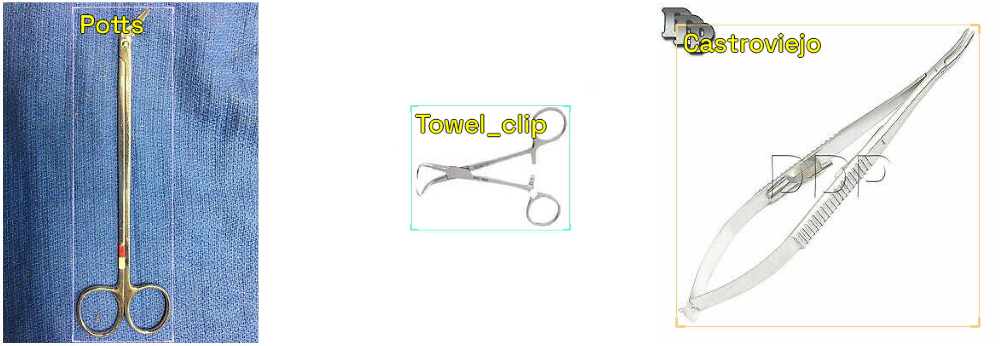

In [184]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

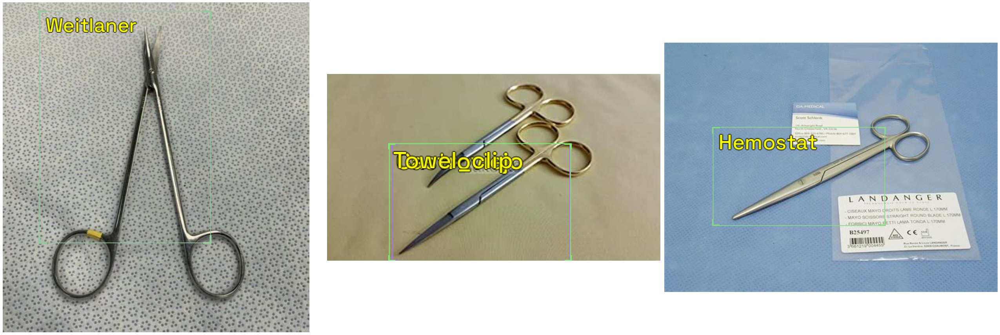

In [185]:
show_records(train_records_ps[0:3],ncols=3, font_size=30, label_color = '#ffff00')

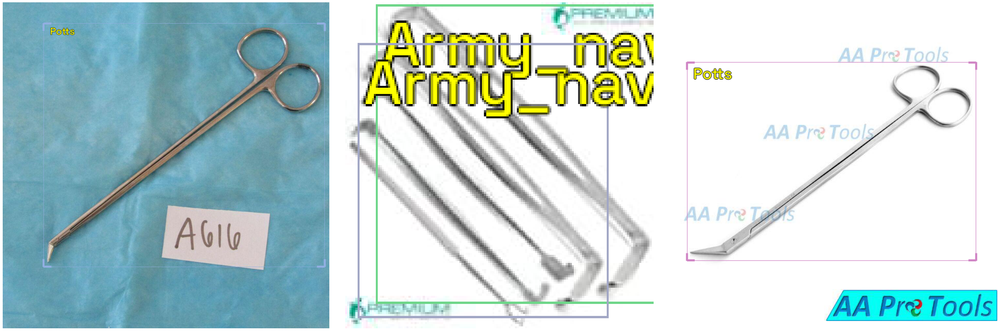

In [186]:
show_records(valid_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [200]:
## point of merging
train_records_ = torch.utils.data.ConcatDataset([train_records, train_records_ps])
print(len(train_records))
print(len(train_records_ps))
print(len(train_records_))
## pseudolabels -- only 11? expect 100
## only 11 parsed  --> find a way to put the others back to join test set

133
11
144


In [201]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [202]:
## point of merging -> didn't work: len(train_ds) output: 2, expect 133
#train_ds = Dataset([train_records,train_records_ps], train_tfms) ##
#valid_ds = Dataset(valid_records, valid_tfms)

In [203]:
train_ds = Dataset(train_records_, train_tfms) ##
valid_ds = Dataset(valid_records, valid_tfms)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

model_type = models.mmdet.retinanet ##
backbone = model_type.backbones.resnet50_fpn_1x ##

checkpoint_and_model = model_from_checkpoint('Model_B_pilot.pth')
model = checkpoint_and_model['model'] ## using Model B

In [205]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=2.511886486900039e-05)

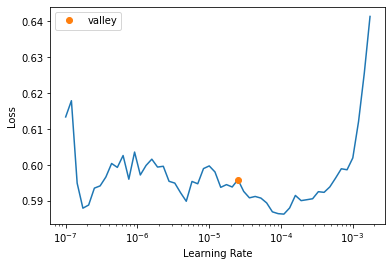

In [206]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics)
learn.lr_find() 

In [207]:
learn.fine_tune(10, 2.5e-5) ## to generate Model B1

epoch,train_loss,valid_loss,COCOMetric,time
0,0.600954,0.875541,0.153328,00:09


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,0.592880,0.862273,0.151340,00:09
1,0.586198,0.860093,0.158172,00:10
2,0.579603,0.875123,0.154511,00:10
3,0.580719,0.859341,0.168620,00:10
4,0.572354,0.865855,0.169958,00:10
5,0.571350,0.853931,0.171668,00:09
6,0.569623,0.860628,0.173333,00:10
7,0.564862,0.863385,0.174166,00:10
8,0.562646,0.865372,0.169499,00:10
9,0.560805,0.865732,0.168752,00:10


In [208]:
checkpoint_path = 'Model_B1_pilot.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.retinanet', 
                        backbone_name='resnet50_fpn_1x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

Use Student Model B1 for inference on U2 + 'unused' images from U1.

In [ ]:
preds_saved[0].pred

In [213]:
infer_ds

<Dataset with 100 items>

In [ ]:
for x in range(len(preds_saved)):
  print(preds_saved[x].pred)

In [233]:
Set_U1_a = []
for x in range(len(preds_saved)):
  if preds_saved[x].pred.detection.labels == []:
    Set_U1_a.append(preds_saved[x].pred.common.filepath)
    #print(preds_saved[x].pred)

In [ ]:
Set_U1_a
# path list of unannotated images

Merge unannotated images with new test dataset Set_4 (Use Surg400)

In [243]:
imgs_retained = [PIL.Image.open(file) for file in Set_U1_a]

retained_ds = Dataset.from_images(imgs_retained, valid_tfms, class_map = class_map)

#img_retained = get_image_files(Set_U1_a)
retained_ds

<Dataset with 89 items>

In [240]:
!ls gdrive/MyDrive/Surg_pilot/Set_4

raw_images


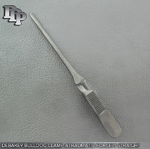

In [244]:
images = Path('gdrive/MyDrive/Surg_pilot/Set_4/raw_images')

img_files = get_image_files(images)

img = PIL.Image.open(img_files[0])
#img = img.convert('RGB')

img.to_thumb(150,150)

In [245]:
# same classes

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [246]:
infer_ds_ = torch.utils.data.ConcatDataset([infer_ds, retained_ds])

In [249]:
len(infer_ds_)

189

In [ ]:
checkpoint_and_model = model_from_checkpoint('Model_B1_pilot.pth')
model = checkpoint_and_model['model'] # Model B1
model.eval()

In [253]:
# generating pseudolabels of Set 4 and unused Set3 using Model B1
infer_dl = model_type.infer_dl(infer_ds_, batch_size=4, shuffle=False) ##

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 

  0%|          | 0/48 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


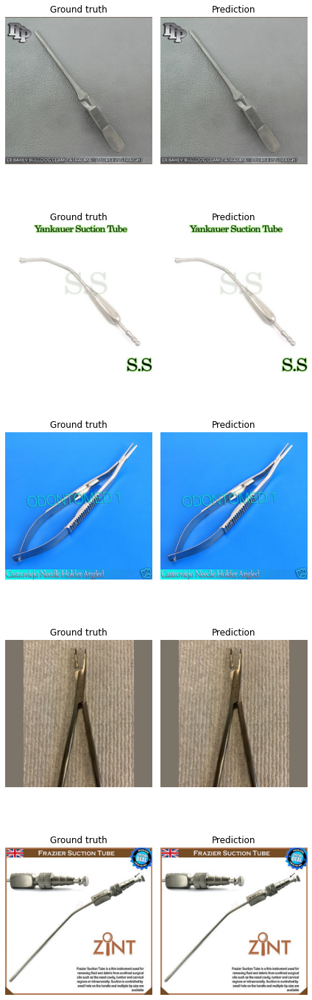

In [254]:
show_preds(preds = preds_saved[0:5])